# Import

In [36]:
import torch
import json
from eval import load_model, load_images, extract_features, compute_similarity
import matplotlib.pyplot as plt

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# Load model

In [22]:
model_infonce, pretrained = load_model("checkpoints/resnet152-partial_infonce/last.ckpt", device)
model_sigmoid, pretrained = load_model("checkpoints/resnet152-partial_sigmoid/last.ckpt", device)

Loading trained model


/raid/homes/lorenzo.bianchi/miniconda3/envs/coptic/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/raid/homes/lorenzo.bianchi/miniconda3/envs/coptic/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.



Loading trained model


# Load Images

In [8]:
with open('annotations/coptic_dataset.json', 'r') as f:
    test_data = json.load(f)

imgs = load_images(test_data, 'coptic_dataset', use_augmentation=False)

Loading images...


100%|██████████| 6677/6677 [00:37<00:00, 176.13it/s]


# Features extraction

In [ ]:
infonce_embeddings = extract_features(model_infonce, imgs, device)
torch.save(infonce_embeddings, 'embeddings/infonce_embeddings.pt')

Preprocessing images...


100%|██████████| 6677/6677 [00:51<00:00, 129.91it/s]


Extracting features...


100%|██████████| 27/27 [00:03<00:00,  8.19it/s]


Feature extraction took 3.3 seconds


In [23]:
sigmoid_embeddings = extract_features(model_sigmoid, imgs, device)
torch.save(sigmoid_embeddings, 'embeddings/sigmoid_embeddings.pt')

Preprocessing images...


100%|██████████| 6677/6677 [08:10<00:00, 13.62it/s]


Extracting features...


100%|██████████| 27/27 [00:03<00:00,  7.27it/s]


Feature extraction took 3.7 seconds


# Visualization

In [15]:
import umap
import plotly.express as px

def make_plot(data, colors=None, hover_labels=None, sizes=None, title=None):
    if data.shape[1] == 2:
        fig = px.scatter(data, x=0, y=1, color=colors, hover_name=hover_labels, size=sizes, title=None)
    elif data.shape[1] == 3:
        fig = px.scatter_3d(data, x=0, y=1, z=2, color=colors, hover_name=hover_labels, size=sizes, title=None)
    else:
        raise Exception("You can not visualize embeddings with this dimension!")
    return fig

def apply_umap(embeddings, n_dims=3):
    return umap.UMAP(n_components=n_dims).fit_transform(embeddings)

def apply_pca(tensor, n_dims):
    """
    Apply PCA to reduce the dimensions of the input tensor.
    
    Args:
        tensor (torch.Tensor): Input tensor of shape [n, embedding_dimension].
        k (int): Number of principal components to retain.

    Returns:
        torch.Tensor: Tensor of shape [n, k], reduced to k dimensions.
    """
    # 1. Center the Data
    mean_tensor = torch.mean(tensor, dim=0)
    centered_tensor = tensor - mean_tensor

    # 2. Compute the Covariance Matrix
    n = tensor.shape[0]
    cov_matrix = torch.mm(centered_tensor.t(), centered_tensor) / (n - 1)

    # 3. Perform Eigen Decomposition
    eigenvalues, eigenvectors = torch.linalg.eigh(cov_matrix)

    # 4. Sort the Eigenvalues and corresponding Eigenvectors in descending order
    sorted_indices = torch.argsort(eigenvalues, descending=True)
    sorted_eigenvectors = eigenvectors[:, sorted_indices]

    # 5. Project the Data onto the Principal Components
    principal_components = sorted_eigenvectors[:, :n_dims]
    reduced_tensor = torch.mm(centered_tensor, principal_components)

    return reduced_tensor

collections = [img['collection'] for img in test_data['images']]

# Infonce

In [30]:
infonce_embeddings = torch.load('embeddings/infonce_embeddings.pt')
n_dim = 3
reduced_infonce_embeddings_umap = apply_umap(infonce_embeddings.cpu(), n_dim)
reduced_infonce_embeddings_pca = apply_pca(infonce_embeddings.cpu(), n_dim)

/raid/homes/lorenzo.bianchi/miniconda3/envs/coptic/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [33]:
make_plot(reduced_infonce_embeddings_pca, colors=collections)

Computing similarity...
Similarity computation took 0.0 seconds


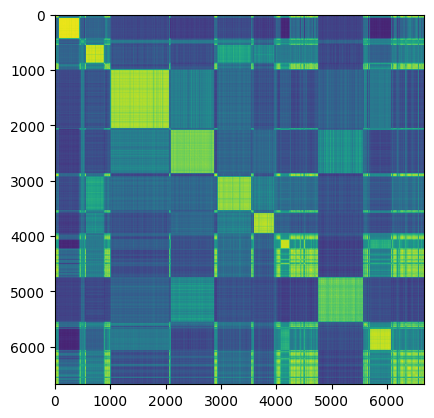

In [38]:
sims = compute_similarity(infonce_embeddings)
plt.imshow(sims.cpu().numpy())

## Sigmoid

In [27]:
sigmoid_embeddings = torch.load('embeddings/sigmoid_embeddings.pt')
n_dim = 3
reduced_sigmoid_embeddings_umap = apply_umap(sigmoid_embeddings.cpu(), n_dim)
reduced_sigmoid_embeddings_pca = apply_pca(sigmoid_embeddings.cpu(), n_dim)

/raid/homes/lorenzo.bianchi/miniconda3/envs/coptic/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [32]:
make_plot(reduced_sigmoid_embeddings_pca, colors=collections)

Computing similarity...
Similarity computation took 0.0 seconds


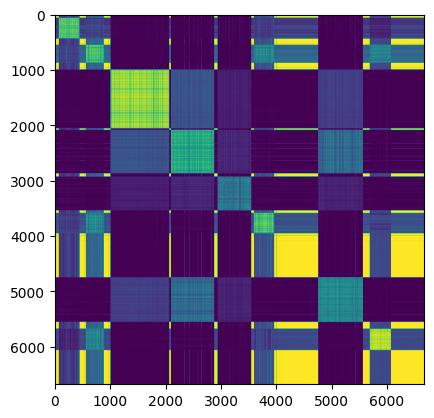

In [ ]:
sims = compute_similarity(sigmoid_embeddings)
plt.imshow(sims.cpu().numpy())